<h1><center>

![](https://i.imgur.com/jrRGMfx.png)

AI PRACTITIONER COURSE 

ASSIGNMENT - SESSION 20 - Deep Convolutional Neural Network

**&copy; 2020 VTCA-COTAI. Internal Use Only.**

</center></h1>

# 18.1 [4 Points] Coding Practice

**DATASET LINK** https://drive.google.com/file/d/1wVLSvR_iQj-TP0i5f5RHmMGACg_I9rAF/view?usp=sharing

**Lưu ý** 

Các phần code sẵn trong Assignment tuy mới nhưng rất dễ hiểu. Học viên cố gắng đọc từng dòng code

**Mục tiêu**
- Thực hành dùng pretrained model để phân loại các tấm hình trái cây thuộc 131 class
- Học cách sử dụng **ImageDataGenerator** để
  -  Lấy ra những batch-data trực tiếp từ thư mục (trước đây là load toàn bộ data lên RAM)
  - Image augmentation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy
from tensorflow.random import set_seed
from tensorflow.keras.backend import clear_session

## 18.1.1 Chuẩn bị dữ liệu

Ở phần này, ta sẽ unzip bộ data **từ Drive của mình vào Drive của Google**. 

Mục đích để đảm bảo tốc độ của việc đọc data trực tiếp.

Lưu ý: Google sẽ tự động xóa data nếu Notebook này Disconnect.

Chạy cell bên dưới để thực hiện unzip (không chỉnh sửa phần -d trở về sau)

In [ ]:
!unzip '/content/drive/MyDrive/Colab Notebooks/s20/fruit360.zip' -d '/'

Streaming output truncated to the last 5000 lines.
  inflating: /fruits-360/Training/Tomato 3/111_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/112_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/113_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/114_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/115_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/116_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/117_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/119_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/120_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/121_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/122_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/123_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/124_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/125_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/126_100.jpg  
  inflating: /fruits-360/Training/Tomato 3/127_100.jpg  
  inflating: /fruits-360/Training/Tom

Ta dùng hàm os.listdir() để kiểm tra thư mục vừa unzip

In [ ]:
import os
os.listdir('/fruits-360')

['Training', 'test-multiple_fruits', 'Test', 'papers', 'readme.md', 'LICENSE']

Kiểm tra thư mục Training

In [ ]:
os.listdir('/fruits-360/Training')

['Eggplant',
 'Apple Pink Lady',
 'Tangelo',
 'Tomato not Ripened',
 'Cucumber Ripe 2',
 'Mango Red',
 'Cocos',
 'Nectarine Flat',
 'Grapefruit White',
 'Passion Fruit',
 'Mulberry',
 'Cherry Rainier',
 'Apple Braeburn',
 'Apple Crimson Snow',
 'Pitahaya Red',
 'Grape White',
 'Pepper Green',
 'Quince',
 'Limes',
 'Physalis',
 'Physalis with Husk',
 'Potato Red Washed',
 'Watermelon',
 'Corn Husk',
 'Tomato Maroon',
 'Apple Red Delicious',
 'Mango',
 'Onion Red',
 'Cantaloupe 1',
 'Peach',
 'Maracuja',
 'Apple Red Yellow 2',
 'Pepper Orange',
 'Guava',
 'Potato White',
 'Pineapple Mini',
 'Grape White 4',
 'Cucumber Ripe',
 'Tomato 3',
 'Lemon Meyer',
 'Carambula',
 'Melon Piel de Sapo',
 'Strawberry',
 'Kohlrabi',
 'Grape Blue',
 'Onion Red Peeled',
 'Raspberry',
 'Pear Williams',
 'Pineapple',
 'Peach Flat',
 'Granadilla',
 'Kiwi',
 'Nut Pecan',
 'Avocado',
 'Grape White 2',
 'Strawberry Wedge',
 'Tomato 1',
 'Cherry Wax Black',
 'Pomelo Sweetie',
 'Pear',
 'Pepper Red',
 'Pear 2',
 

Ta quan sát được, bên trong thư mục Tranining là label của các loại trái cây có trong dataset.

Kiểm tra tổng số label trong thư mục Training và Test

In [ ]:
print('Number of classes in Tranining:',len(os.listdir('/fruits-360/Training')))
print('Number of classes in Test:',len(os.listdir('/fruits-360/Test')))

Number of classes in Tranining: 131
Number of classes in Test: 131


Kiểm tra tổng số hình ảnh trong Training và Test folder

In [ ]:
from tqdm.notebook import tqdm

count_train = 0
count_test = 0
for subdir in tqdm(os.listdir('/fruits-360')):
  dir = os.path.join('/fruits-360', subdir)
  if subdir == 'Training':
    for fruit in tqdm(os.listdir(dir)):
      count_train += len(os.listdir(os.path.join(dir, fruit)))
  elif subdir == 'Test':
    for fruit in tqdm(os.listdir(dir)):
      count_test += len(os.listdir(os.path.join(dir, fruit)))
print('Total image in Training:',count_train)
print('Total image in Test:', count_test)



Total image in Training: 67692
Total image in Test: 22688


Keras cung cấp class ImageDataGenerator đọc dữ liệu và tăng số lượng ảnh (image augmentation) trong Traning Set.

**Ví dụ về image augmentation:** một con mèo thì soi vào gương; dịch sang trái, phải, trên, dưới; đứng trong tối, ngoài sáng; phóng to, thu nhỏ; xoay 1 góc bất kỳ thì cũng vẫn là một con mèo. Vậy thì từ 1 ảnh training, ta có thể tạo ra vô vàn những ảnh tương tự và vẫn có thể được nhận ra là con mèo bằng các phép biến đối ảnh như: rotation, flip, resize, distort, ... Và như vậy, chúng ta có một tập dữ liệu rất lớn cho training. 

Thay vì lưu toàn bộ dữ liệu lên RAM, ImageDataGenerator được thiết kế để lặp đi lặp lại quy trình đọc dữ liệu - augmentation trong quá trình training.

Điều này làm giảm lượng RAM được sử dụng, nhưng làm tăng thời gian huấn luyện mô hình

**Khai báo 1 vài constansts**

In [ ]:
# ở đây ta chọn kích thước của tấm hình input bằng với kích thước mà mô hình gốc đã chọn
MODEL_IMG_W, MODEL_IMG_H = 224, 224
MODEL_INPUT_SHAPE = (MODEL_IMG_W,MODEL_IMG_H,3)
TRAIN_DIR = '/fruits-360/Training/'
TEST_DIR = '/fruits-360/Test/'

BATCH_SIZE = 16

**Import các thư viện cần thiết**

In [ ]:
# ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator


**Khởi tạo và sử dụng ImageDataGenerator**

Toàn bộ những kỹ thuật Augmentation mà Tensorflow hỗ trợ
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

Nếu truyền đúng đường dẫn sẽ thấy kết quả như sau

>Found 54190 images belonging to 131 classes.
>
>Found 13502 images belonging to 131 classes.
>
>Found 22688 images belonging to 131 classes.

In [ ]:
# Khởi tạo ImageDataGenerator, đồng thời khai báo các phương pháp augmentation
train_datagen = ImageDataGenerator(
    shear_range=0.2, # xé hình
    zoom_range=0.2, # zoom random
    horizontal_flip=True,# xoay hình
    validation_split=0.2) # 20% cho validation set
     
val_datagen = ImageDataGenerator(validation_split=0.2)# 20% cho validation set

# Ta không thực hiện augmentation trên Test Set, chỉ scale thôi
# lưu ý thay đổi hàm preprocess_input ở đây nếu dùng model khác
test_datagen = ImageDataGenerator(validation_split=0.5) # dùng 50% mẫu cho tập validation)

# Khởi tạo generator để lấy data
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR, # đường dẫn tới thư mục
    target_size=(MODEL_IMG_H, MODEL_IMG_W), # resize hình theo ý muốn
    batch_size=BATCH_SIZE, # mỗi lần lấy ra bao nhiêu hình
    class_mode='categorical',# binary hoặc categorical cho bài toán classification
    seed=42,
    shuffle=True,
    subset='training')# đánh dấu đây là train set

val_generator = val_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(MODEL_IMG_H, MODEL_IMG_W), 
    batch_size=BATCH_SIZE, 
    class_mode='categorical',
    seed=42,
    shuffle=True,
    subset='validation')# đánh dấu đây là validation set

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(MODEL_IMG_H, MODEL_IMG_W),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    seed=42,
    shuffle=True)

Found 54190 images belonging to 131 classes.
Found 13502 images belonging to 131 classes.
Found 22688 images belonging to 131 classes.


**Kiểm tra phân bố của bộ label**

In [ ]:
# ta dùng dataframe kết hợp với plotly để vẽ chart
import pandas as pd
import plotly.graph_objects as go

In [ ]:
# tạo dataframe từ bộ nhãn được lưu trong generator
training_data = pd.DataFrame(train_generator.classes, columns=['classes'])
testing_data = pd.DataFrame(test_generator.classes, columns=['classes'])

In [ ]:
# hàm tính toán x,y để vẽ chart
def create_stack_bar_data(col, df):
    aggregated = df[col].value_counts().sort_index()
    x_values = aggregated.index.tolist()
    y_values = aggregated.values.tolist()
    return x_values, y_values

In [ ]:
# khởi tạo subplots
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=1,
                    subplot_titles=('Class Distribution in Train Data',
                                    'Class Distribution in Test Data'))

# train plot
xtrain, ytrain = create_stack_bar_data('classes', training_data)
xtrain = list(train_generator.class_indices.keys())
trace_train = go.Bar(x=xtrain, y=ytrain, opacity=0.75, name='Train')
fig.add_trace(trace_train,row=1, col=1)

# test plot
xtest, ytest = create_stack_bar_data('classes', testing_data)
xtest = list(test_generator.class_indices.keys())
trace_test = go.Bar(x=xtest, y=ytest, opacity=0.75, name='Test')
fig.add_trace(trace_test,row=2, col=1)

# plot
fig.update_layout(height=900, width=1000)
fig.show()

## 18.1.2 Visualize

Ta thực hiện plot toàn bộ 131 loại trái cây (mỗi loại 1 tấm hình)

**Double-click để phóng to**

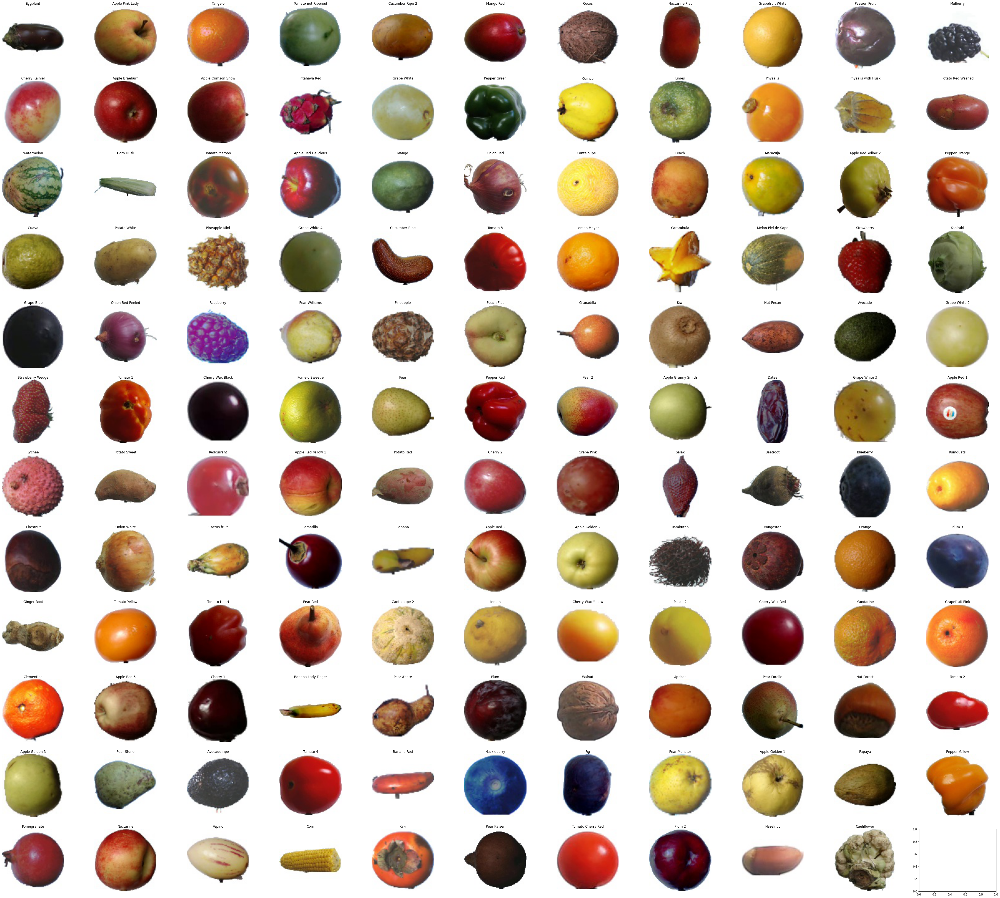

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
subdir = os.listdir('/fruits-360/Training')

cols = 11
rows = 12
fig, axs = plt.subplots(rows, cols, figsize=(6 * cols - 1, 5 * rows - 1))
for i in range(rows):
  for j in range(cols):
    if (i * cols + j) >= 131:
      continue
    path = os.path.join('/fruits-360/Training', subdir[i*cols+j])
    img_path = os.listdir(path)[0]
    img_path = os.path.join(path, img_path)
    img = Image.open(img_path)
    axs[i][j].grid('off')
    axs[i][j].axis('off')
    axs[i][j].imshow(img)
    axs[i][j].set_title(subdir[i*cols+j])
plt.show()

## 18.1.3 [2 Point] Khởi tạo và huấn luyện model

In [ ]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import *

Ta thử sử dụng pretrained model EfficientNetB7.




In [ ]:
# pretrained model
from tensorflow.keras.applications import InceptionResNetV2
# preprocess input
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
import numpy as np
set_seed(42)
np.random.seed(42)
clear_session()
# TODOs: Hoàn thành phần code bên dưới để tạo mô hình có backbone là EfficientNetB7
# nhớ freeze weights của các backbone

def create_model(loss, optimizer) :
    input = Input(shape = MODEL_INPUT_SHAPE)
    x = preprocess_input(input)
    feature_extracting = InceptionResNetV2(
        include_top = False,
        weights = 'imagenet',
        pooling = 'avg',
        input_shape = MODEL_INPUT_SHAPE)
    feature_extracting.trainable = False
    x = feature_extracting(x)
    x = Dense(512,kernel_initializer='he_uniform')(x)
    x = Dropout(0.5)(x)
    x = Activation('relu')(x)
    output = Dense(131,activation = 'softmax')(x)
    efficient_model = Model(inputs=input, outputs=output)
    efficient_model.compile(loss =loss, optimizer  = optimizer, metrics = 'accuracy')
    return efficient_model

# model

# compile

efficient_model = create_model('categorical_crossentropy', 'adam')
# summary model
efficient_model.summary()

219062272/219055592 [==============================] - 13s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.math.truediv (TFOpLambda) (None, 224, 224, 3)       0         
_________________________________________________________________
tf.math.subtract (TFOpLambda (None, 224, 224, 3)       0         
_________________________________________________________________
inception_resnet_v2 (Functio (None, 1536)              54336736  
_________________________________________________________________
dense (Dense)                (None, 512)               786944    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
___________________________________________________________

Do sử dụng ImageDataGenerator, khi fit model ta chỉ cần truyền vào train_generator.

In [ ]:
history_efficient = efficient_model.fit(
    train_generator,
    epochs=1, 
    validation_data = val_generator,
    verbose = 1)

3387/3387 [==============================] - 858s 250ms/step - loss: 1.8789 - accuracy: 0.5238 - val_loss: 0.2422 - val_accuracy: 0.9202


**Evaluate trên Test Set**

In [ ]:
efficient_model.evaluate(test_generator)

1418/1418 [==============================] - 183s 129ms/step - loss: 0.3763 - accuracy: 0.8853


[0.37633833289146423, 0.8853138089179993]

## 18.1.4 [2 Points] Survey

Ở bước này ta thực hiện khảo sát một vài model nổi tiếng mà Tensorflow cung cấp.


```
# pretrained model
from tensorflow.keras.applications import EfficientNetB7, MobileNetV2, InceptionV3, InceptionResNetV2
# preprocess input
from tensorflow.keras.applications import efficientnet, mobilenet_v2, inception_v3, inception_resnet_v2
```

**Lưu ý** nhớ dùng đoạn code sau tại vị trí tạo mô hình
```
set_seed(42)
np.random.seed(42)
clear_session()
```
Học viên tiến hành test các model trên và điền vào bảng report bên dưới. Lưu ý chỉ cần chạy 1 epochs thôi


Model Name | Total Parameters (Millions)| Trainable Parameters (M) |Training Time (s) | Accuraccy on Train | Accuracy on Validaion | Accuracy on Test
-|-|-|-|-|-|-
EfficientNetB7|65,476,122|1,378,435|1267|0.6866|0.9439|0.9090
MobileNetV2|2,981,059|723,075|633|0.7181|0.9473|0.9096
InceptionV3|22,919,075|1,116,291|695|0.5478|0.9322|0.8878
InceptionResNetV2|55,190,883|854,147|858|0.5238|0.9202|0.8853